### Setup

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import os
import json
import pandas as pd
import numpy as np
import random
import cv2
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
from matplotlib.pyplot import Rectangle

In [2]:
# Untar files into data directory
# tar zxvf bbox_images.tar.gz
DATA_DIR = '/bigguy/data/volleyball/'
IMG_DIR = os.path.join(DATA_DIR, 'images_subset')
metadata_fpath = os.path.join(IMG_DIR, 'bbox_labels.csv')

In [3]:
# Remove 4 bad files
%rm {DATA_DIR}._* 

rm: cannot remove '/bigguy/data/volleyball/._*': No such file or directory


### Helpers

In [4]:
def plot_img(arr, fs=(6,6), cmap='gray', title=None):
    plt.figure(figsize=fs)
    plt.imshow(arr, cmap=cmap)
    plt.title(title)
    plt.show()
    
def load_img(fpath):
    return plt.imread(fpath)

def load_cv2_img(fpath, w=None, h=None):
    img = cv2.imread(img_fpath)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if None not in [w,h]:
        img = cv2.resize(img, (w, h), interpolation=cv2.INTER_CUBIC)
    return img

def make_boxes(meta):
    boxes = {}
    for idx,row in meta.iterrows():
        box = json.loads(row.to_json())
        fname = row['filename']
        if fname in boxes:
            boxes[fname].append(box)
        else:
            boxes[fname] = [box]
    return boxes

In [5]:
metadata = pd.read_csv(metadata_fpath)
metadata['label_name'] = 'ball'
metadata['label_id'] = 1
fnames = metadata['filename']
fpaths = [os.path.join(IMG_DIR, f) for f in fnames]
metadata['fpath'] = fpaths
GT_BOXES = make_boxes(metadata)

### Explore

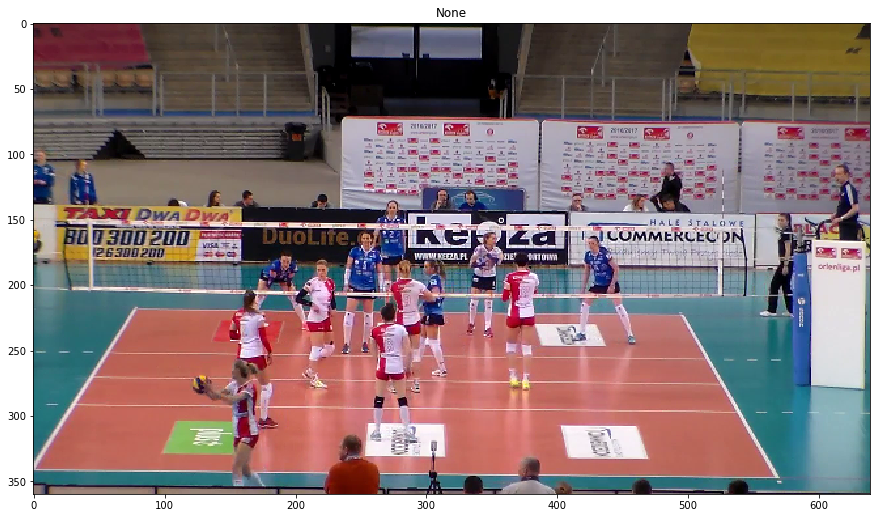

In [6]:
img_fpath = fpaths[random.randint(0,len(fpaths)-1)]
img = load_img(img_fpath)
img = load_cv2_img(img_fpath, 640, 360)
plot_img(img, fs=(15,12))

### Canny Edge Detector

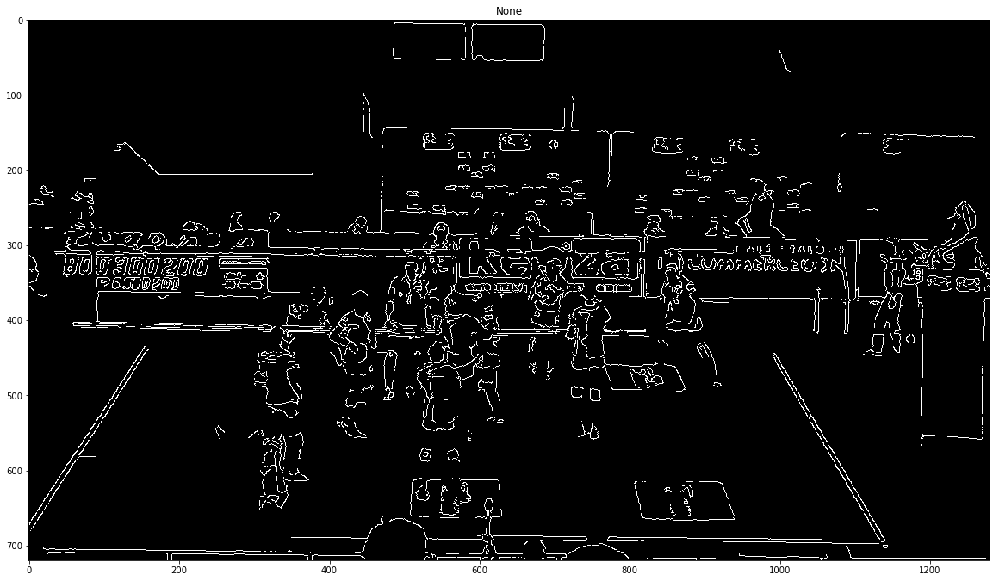

In [7]:
img = load_cv2_img(img_fpath)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, ksize=(5,5), sigmaX=3)

# use Canny edge detector to find edges in the image.  The thresholds determine how
# weak or strong an edge will be detected.  These can be tweaked.
lower_threshold = 100
upper_threshold = 200
edges = cv2.Canny(gray, lower_threshold, upper_threshold)
plot_img(edges, fs=(20,20))

### Hough Transform

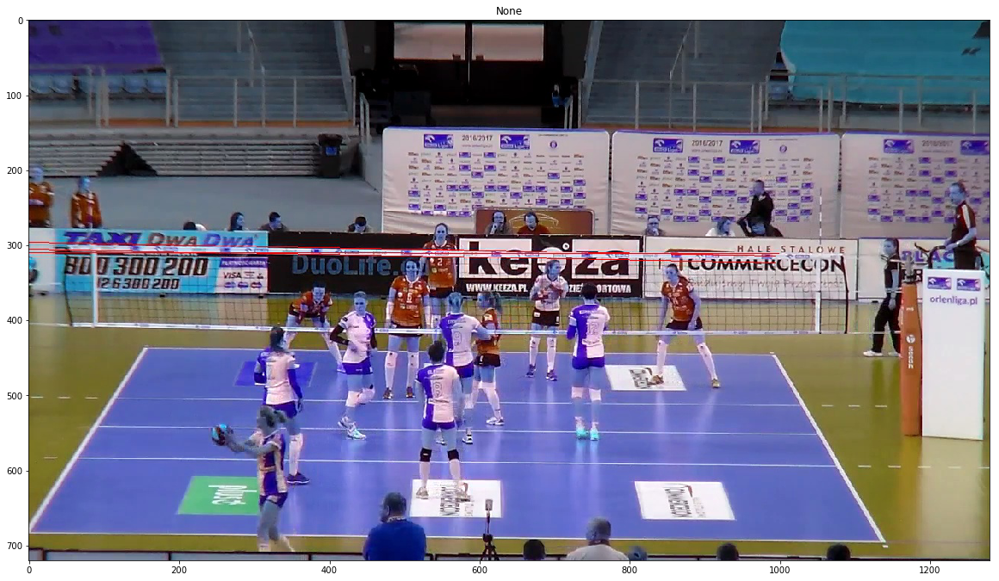

In [8]:
# Hough Transform - Lines

# detect lines in the image.  This is where the real work is done.  Higher threshold
# means a line needs to be stronger to be detected, so again, this can be tweaked.
threshold = 300
lines = cv2.HoughLines(edges, 1, np.pi / 180, threshold)

# convert each line to coordinates back in the original image
for line in lines:
    for rho, theta in line:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * -b)
        y1 = int(y0 + 1000 * a)
        x2 = int(x0 - 1000 * -b)
        y2 = int(y0 - 1000 * a)

        # draw each line on the image
        cv2.line(img, (x1, y1), (x2, y2), (0, 0, 255), 1)

# write the image to disk
cv2.imwrite('houghlines.jpg', img)
plot_img(load_img('houghlines.jpg'), fs=(20,15))

### Harris Corners

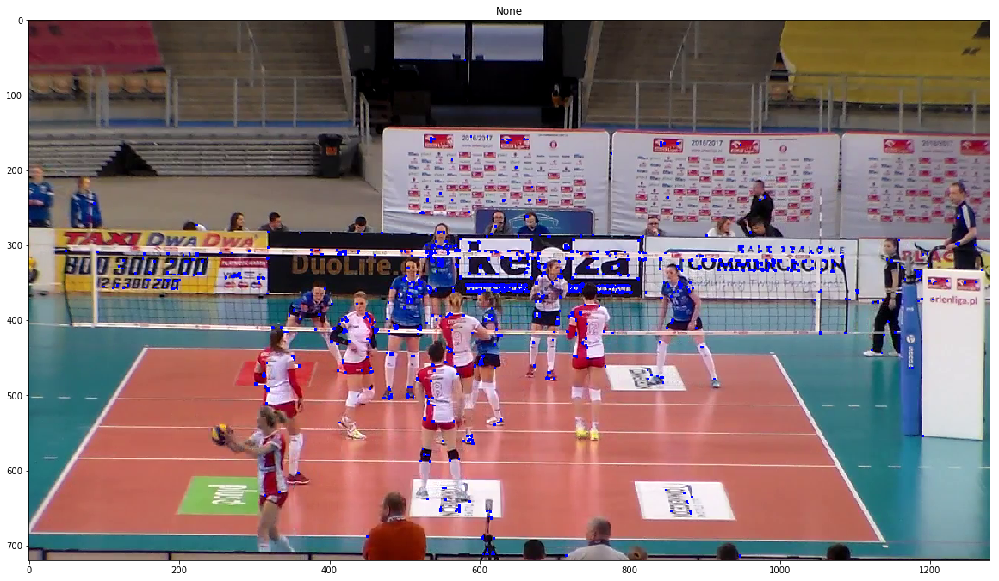

In [9]:
img = load_cv2_img(img_fpath)
gray = cv2.GaussianBlur(gray, ksize=(5,5), sigmaX=3)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)

dst = cv2.cornerHarris(gray,2,3,0.04)

#result is dilated for marking the corners, not important
dst = cv2.dilate(dst,None)

# Threshold for an optimal value, it may vary depending on the image.
img[dst>0.05*dst.max()]=[0,0,255]

plot_img(img, fs=(20,15))

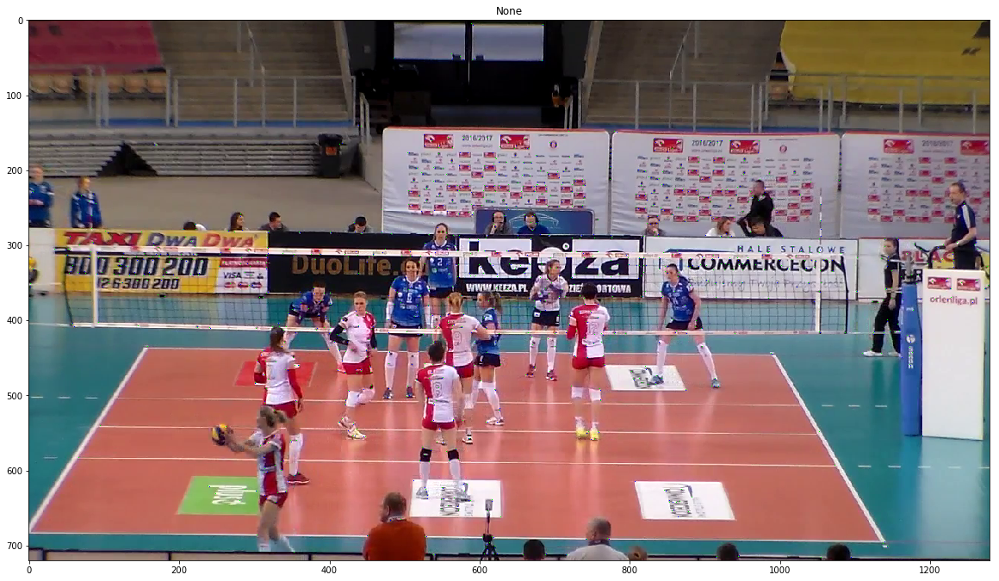

In [10]:
img = load_cv2_img(img_fpath)
#gray = cv2.GaussianBlur(gray, ksize=(5,5), sigmaX=3)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)

dst = cv2.cornerHarris(gray,2,3,0.04)
dst = cv2.dilate(dst,None)
ret, dst = cv2.threshold(dst,0.01*dst.max(),255,0)
dst = np.uint8(dst)

# find centroids
ret, labels, stats, centroids = cv2.connectedComponentsWithStats(dst)

# define the criteria to stop and refine the corners
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001)
corners = cv2.cornerSubPix(gray,np.float32(centroids),(5,5),(-1,-1),criteria)

# Now draw them
res = np.hstack((centroids,corners))
res = np.int0(res)
img[res[:,1],res[:,0]]=[0,0,255]
img[res[:,3],res[:,2]] = [0,255,0]

plot_img(img, fs=(20,15))

### Contours

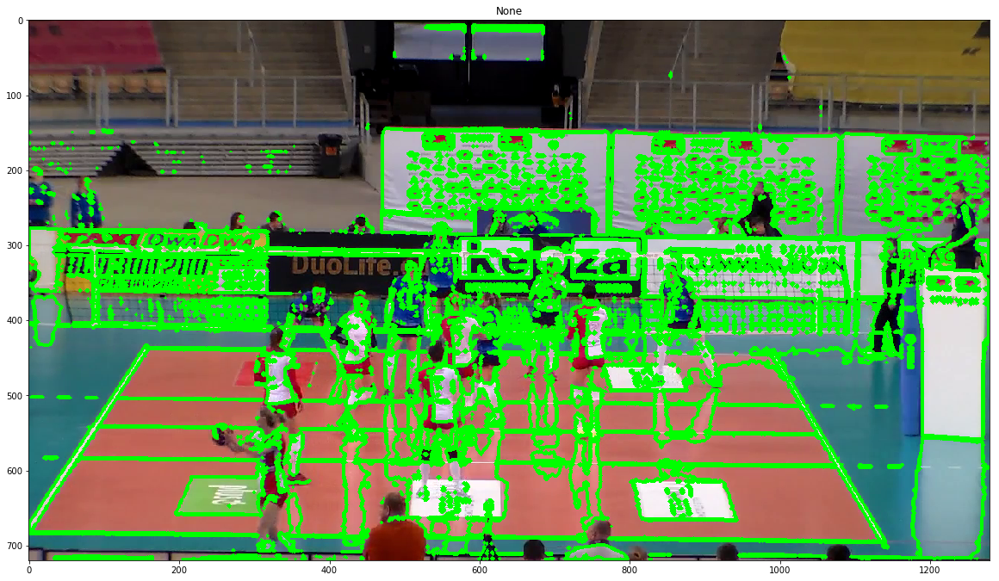

In [15]:
img = load_cv2_img(img_fpath)
gray = cv2.GaussianBlur(gray, ksize=(5,5), sigmaX=3)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

ret,thresh = cv2.threshold(gray, 127, 255, 0)
image, contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
img = cv2.drawContours(img, contours, -1, (0,255,0), 3)
plot_img(img, fs=(20,15))

In [60]:
# https://docs.opencv.org/3.3.1/dd/d49/tutorial_py_contour_features.html



46080.0

### Histograms

In [171]:
img = cv2.imread(img_fpath)

In [172]:
# Loading Histogram

# OpenCV - faster
hist = cv2.calcHist(images=[img], channels=[0], mask=None, histSize=[256], ranges=[0,256])

# Numpy
hist, bins = np.histogram(img.ravel(), 256, [0,256])

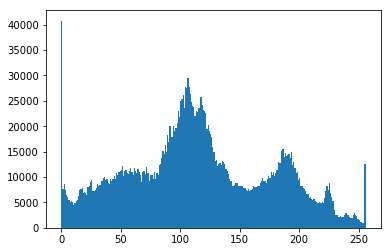

In [173]:
# Plotting Histogram
plt.hist(img.ravel(), 256, [0,256])
plt.show()

In [174]:
# Color histogram

def plot_color_hist(img, bins=256, mask=None):
    # Mask let's you select for certain regions
    
    color = ('b','g','r')
    for i,col in enumerate(color):
        histr = cv2.calcHist([img],[i],mask,[bins],[0,256])
        plt.plot(histr, color=col)
        plt.xlim([0,bins])
    plt.show()

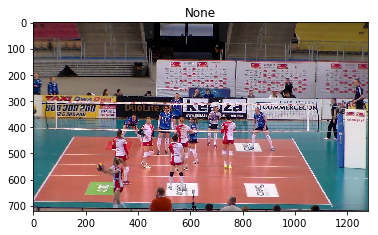

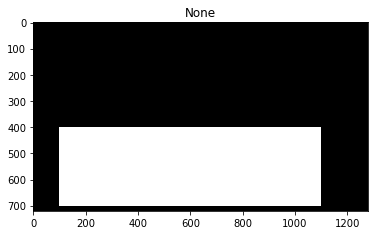

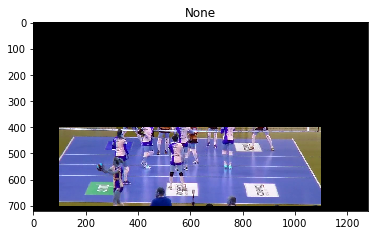

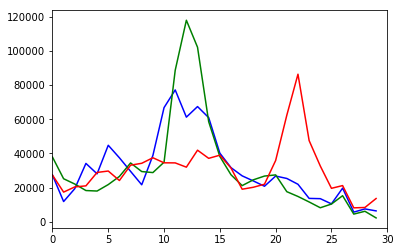

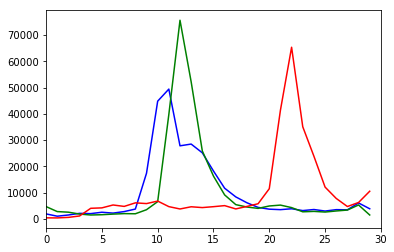

In [175]:
## Applying a Mask

mask = np.zeros(img.shape[:2], np.uint8)
mask[400:700, 100:1100] = 255
masked_img = cv2.bitwise_and(img, img, mask=mask)

plot_img(load_cv2_img(img_fpath))
plot_img(mask)
plot_img(masked_img)

plot_color_hist(img, bins=30)
plot_color_hist(img, bins=30, mask=mask)

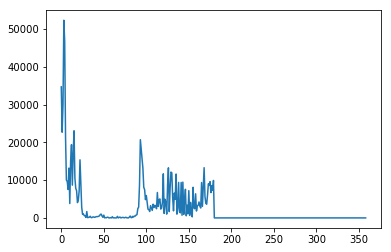

In [187]:
# HSV Histogram - Hue holds the color information nicely
img = cv2.imread(img_fpath)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
hist = cv2.calcHist(images=[hsv], channels=[0], mask=None, histSize=[359], ranges=[0,359])
plt.plot(hist)

In [190]:
hsv.shape

(720, 1280, 3)

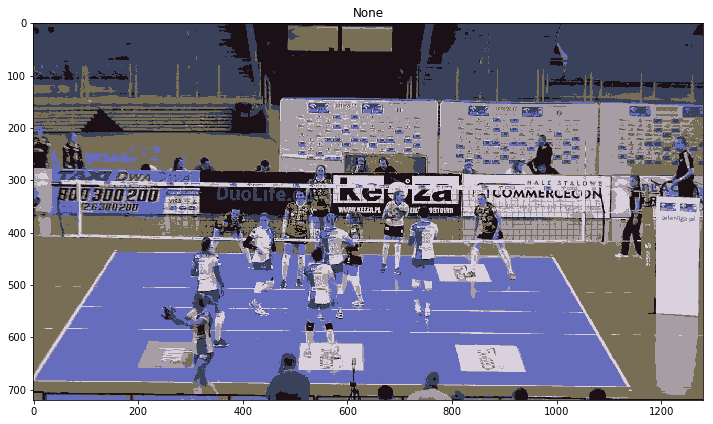

In [162]:
# Color Quantization
# https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_ml/py_kmeans/py_kmeans_opencv/py_kmeans_opencv.html

img = cv2.imread(img_fpath)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
Z = img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 6
ret, label, center = cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)

# Now convert back into uint8, and make original image
center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape((img.shape))

plot_img(res2, fs=(12,8))

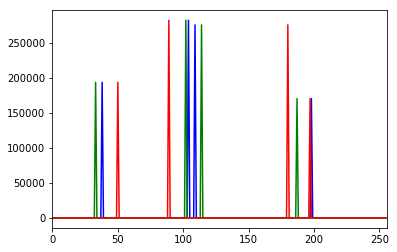

In [158]:
plot_color_hist(res2)

In [164]:
h,w,c = img.shape
minarea = h * w / 10
gray = cv2.GaussianBlur(res2, ksize=(5,5), sigmaX=3)
gray = cv2.cvtColor(gray, cv2.COLOR_BGR2GRAY)

ret,thresh = cv2.threshold(gray, 127, 255, 0)
image, contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
img = cv2.drawContours(img, contours, -1, (0,255,0), 3)

In [165]:
for cnt in contours:
    if cv2.contourArea(cnt) < minarea:
        img = cv2.drawContours(img, [cnt], -1, (0,0,0), 3)


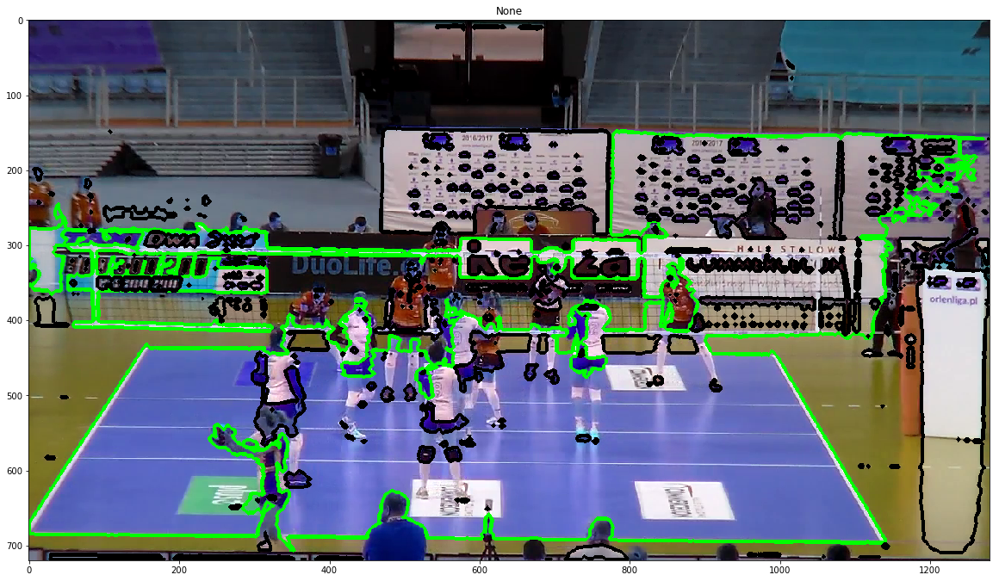

In [166]:
plot_img(img, fs=(20,15))

In [ ]:
# Segment with Color Range

# Find the dominant color in the target region with masking
mask = np.zeros(img.shape[:2], np.uint8)
mask[600:650, 100:150] = 255
masked_img = cv2.bitwise_and(img, img, mask=mask)

plot_img(load_cv2_img(img_fpath))
plot_img(mask)
plot_img(masked_img)

plot_color_hist(img, bins=256)
plot_color_hist(img, bins=256, mask=mask)

In [244]:
img = cv2.imread(img_fpath)
img = cv2.GaussianBlur(img, ksize=(5,5), sigmaX=3)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

court_color_bgr = np.uint8([[[75,100,190]]])
hsv_court_color = cv2.cvtColor(court_color_bgr, cv2.COLOR_BGR2HSV)
hue = hsv_court_color[0][0][0]
hue

7

In [245]:
# define range of red color in HSV
lower = np.array([hue-5,10,10])
upper = np.array([hue+20,255,255])

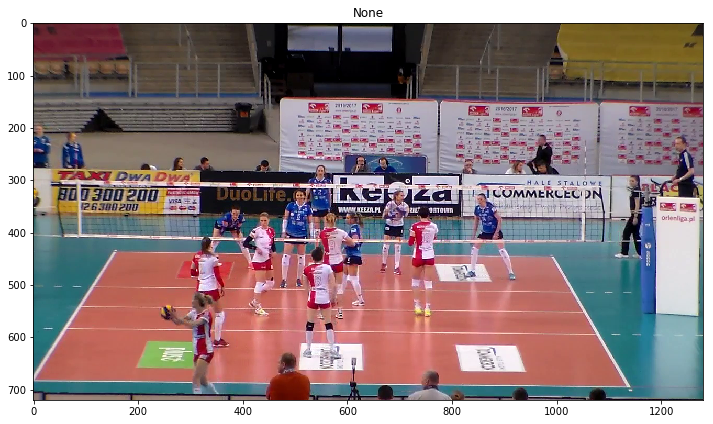

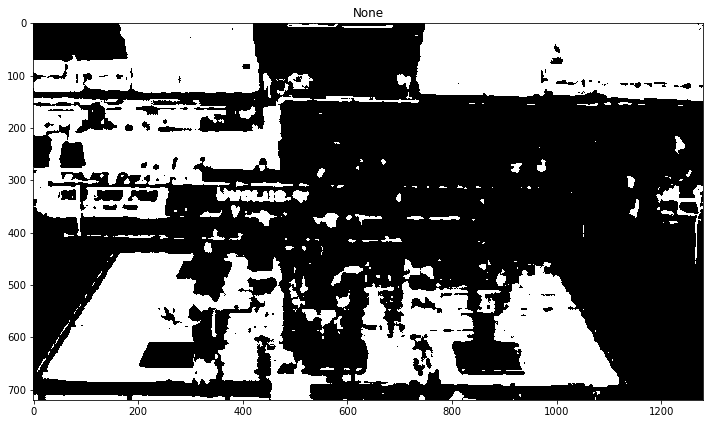

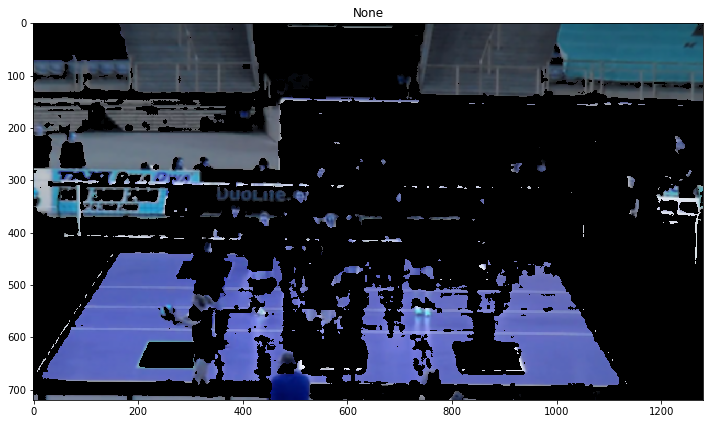

In [246]:
# Threshold the HSV image to get only blue colors
mask = cv2.inRange(hsv, lower, upper)
 
# Bitwise-AND mask and original image
masked_img = cv2.bitwise_and(img, img, mask=mask)

plot_img(load_cv2_img(img_fpath), fs=(12,8))
plot_img(mask, fs=(12,8))
plot_img(masked_img, fs=(12,8))

In [247]:
gray = cv2.cvtColor(masked_img, cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(gray, 127, 255, 0)
image, contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
img = cv2.drawContours(img, contours, -1, (0,255,0), 3)

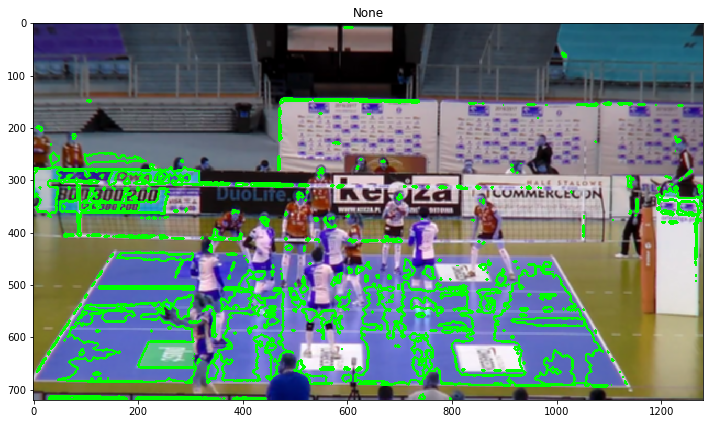

In [248]:
plot_img(img, fs=(12,8))

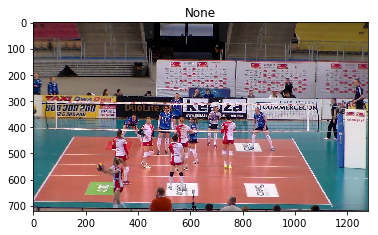

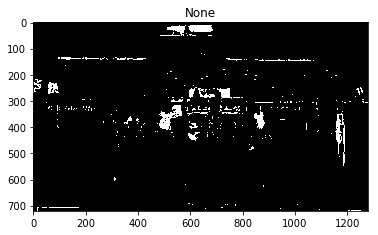

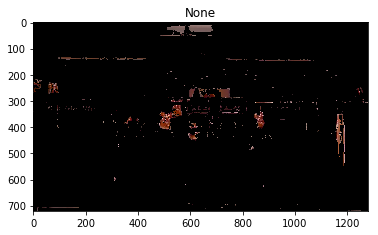

In [143]:
# define range of red color in HSV
lower = np.array([110,50,50])
upper = np.array([130,255,255])

# Threshold the HSV image to get only blue colors
mask = cv2.inRange(hsv, lower, upper)
 
# Bitwise-AND mask and original image
masked_img = cv2.bitwise_and(img, img, mask=mask)

plot_img(load_cv2_img(img_fpath))
plot_img(mask)
plot_img(masked_img)

In [109]:
h,w,c = img.shape
minarea = h * w / 10
img = cv2.imread(img_fpath)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, ksize=(5,5), sigmaX=2)
ret, thresh = cv2.threshold(gray, 127, 255, 0)
image, contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

In [110]:
cnts = []
for cnt in contours:
    if cv2.contourArea(cnt) > minarea:
        cnts.append(cnt)
len(cnts)

1

### Animation

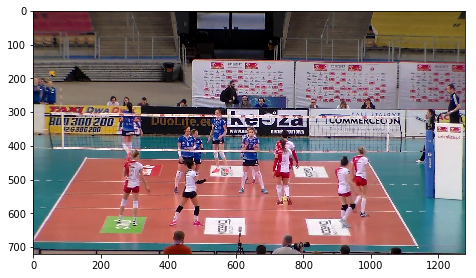

In [198]:
# Got it working!
fig = plt.figure()
axes = plt.axes([0, 0.03, 1, 0.97])

img = plt.imread(fpaths[0])
imgplot = axes.imshow(img, animated=True)

In [199]:
all_boxes = GT_BOXES
def init():
    return (imgplot,)

def animate_w_boxes(fname):
    fpath = os.path.join(IMG_DIR, fname)
    img = plt.imread(fpath)
    imgplot.set_array(img)
    
    # Remove old boxes
    for p in axes.patches:
        p.remove()
    boxes = all_boxes[fname]
    for box in boxes:
        width = box['x2'] - box['x1']
        height = box['y2'] - box['y1']
        bb = Rectangle(
            (box['x1'],box['y1']), 
            width, height,
            fill=False,
            edgecolor="red")
        axes.add_patch(bb)    
    return (imgplot,)

In [200]:
# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate_w_boxes, init_func=init,
                               frames=fnames, interval=100, blit=True)

In [201]:
# ~1 minute to general
HTML(anim.to_html5_video())

### Mask RCNN

### Links

* https://towardsdatascience.com/how-to-train-your-own-object-detector-with-tensorflows-object-detector-api-bec72ecfe1d9
* https://github.com/christopher5106/FastAnnotationTool
* http://androidkt.com/train-object-detection/
* https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/using_your_own_dataset.md
* https://towardsdatascience.com/building-a-real-time-object-recognition-app-with-tensorflow-and-opencv-b7a2b4ebdc32